## Processing Ocean Color Imagery

In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
import geopandas as gpd
import pandas as pd


import os, glob
import multiprocessing

import cv2
import numpy as np
import matplotlib.pyplot as plt

import exiftool
import datetime

import rasterio

from utils import *
from georeg import *

Check the panel irradiance:


In [2]:
panelNames = ['data/20210304_duml_newgimbal_mapping_testing_slim/panel/IMG_0007_1.tif',
  'data/20210304_duml_newgimbal_mapping_testing_slim/panel/IMG_0007_2.tif',
  'data/20210304_duml_newgimbal_mapping_testing_slim/panel/IMG_0007_3.tif',
  'data/20210304_duml_newgimbal_mapping_testing_slim/panel/IMG_0007_4.tif',
  'data/20210304_duml_newgimbal_mapping_testing_slim/panel/IMG_0007_5.tif'
]

In [3]:
panelCap = capture.Capture.from_filelist(glob.glob('data/20210304_duml_newgimbal_mapping_testing_slim/panel/IMG_0009*.tif'))
if panelCap.panel_albedo() is not None and not any(v is None for v in panelCap.panel_albedo()):
    panel_reflectance_by_band = panelCap.panel_albedo()
    print(panel_reflectance_by_band)
else:
    #panel_reflectance_by_band = [0.67, 0.69, 0.68, 0.61, 0.67] #RedEdge band_index order
    panel_reflectance_by_band = [0.493, 0.493, 0.492, 0.489, 0.491]

panel_irradiance = panelCap.panel_irradiance(panel_reflectance_by_band)    
panel_irradiance

[0.5368749999999999, 0.5355999999999999, 0.5339799999999999, 0.5313699999999999, 0.5332449999999999]


[1.057098336950143,
 1.1128804208144099,
 0.9701722761988811,
 0.6248174090945774,
 0.7761155975397356]

In [4]:
panel_irradiance

[1.057098336950143,
 1.1128804208144099,
 0.9701722761988811,
 0.6248174090945774,
 0.7761155975397356]

In [5]:
panelCap.utc_time()

datetime.datetime(2021, 3, 4, 16, 16, 34, 199743, tzinfo=<UTC>)

In [6]:
panel_irradiance

[1.057098336950143,
 1.1128804208144099,
 0.9701722761988811,
 0.6248174090945774,
 0.7761155975397356]

This is in (W/m^2/nm) 

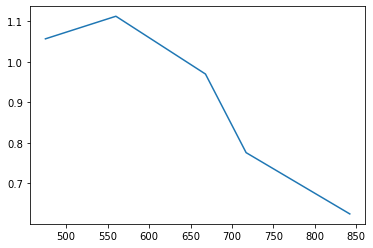

In [7]:
plt.plot([475, 560, 668, 717,  842],
         [   1.0571013411345331,
             1.1128816146879417,
             0.9701722328979654,
             0.7761130655438683,
             0.6248174616755621,
])

In [13]:
panel_reflectance_by_band

NameError: name 'panel_reflectance_by_band' is not defined

In [7]:
panel_irradiance, img_type, location, utc_time = process_panel_img(panelNames)

ValueError: Input must be >= 2-d.

In [27]:
panel_irradiance

[1.057098336950143,
 1.1128804208144099,
 0.9701722761988811,
 0.6248174090945774,
 0.7761155975397356]

In [8]:
#grab last 4 characters of the file name:
def last_10chars(x):
    return(x[-10:])

# img_fns = glob.glob('data/20210304_duml_newgimbal_mapping_testing_slim/sea' + "/*.tif")
img_fns = glob.glob('../../../../media/clifgray/Seagate Backup Plus Drive/uas_ocean_color_data/20210304_duml_newgimbal_mapping_testing/sea/*.tif')


img_fns = sorted(img_fns, key = last_10chars)

In [9]:
ls data/20210304_duml_newgimbal_mapping_testing_slim

panel/  sea/  SYNLog-16-17-34_04-03-2021_edit.csv*


In [10]:
alta_logs = format_alta_logs('data/20210304_duml_newgimbal_mapping_testing_slim/SYNLog-16-17-34_04-03-2021_edit.csv')
alta_logs.head()

/home/clifgray/anaconda3/envs/micasense_ocean_color/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3347: DtypeWarning: Columns (0,1,2,4,5,6,7,9) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


,Reading,IMU Time,Date,GPS Time,Unnamed: 4,Longitude,Latitude,GPS Height,GPS Course,GPS Pos N,...,Gyro Bias P,Gyro Bias Y,Accel Bias X,Accel Bias Y,Accel Bias Z,Extended Status,5V Alarm,Z Vibration,Checksum,id
dt,,,,,,,,,,,,,,,,,,,,,
2021-03-04 16:17:34.000000,26,0.976,20210304,16:17:34,NaN,-766727168,347156224,-0.3,22.8,-1.26,...,-33.8277,6.4131,0.0,0.0,0.246,0.0,0.0,0.03,54.0,0
2021-03-04 16:17:34.000001,28,1.056,20210304,16:17:34,NaN,-766727168,347156224,-0.3,22.8,-1.26,...,-33.8290,6.4075,0.0,0.0,0.246,0.0,0.0,0.03,249.0,1
2021-03-04 16:17:34.000002,29,1.096,20210304,16:17:34,NaN,-766727168,347156224,-0.3,22.8,-1.26,...,-33.8293,6.4075,-0.0,-0.0,0.246,0.0,0.0,0.03,28.0,2
2021-03-04 16:17:34.000003,30,1.136,20210304,16:17:34,NaN,-766727168,347156224,-0.3,22.8,-1.26,...,-33.8297,6.4073,-0.0,-0.0,0.246,0.0,0.0,0.03,107.0,3
2021-03-04 16:17:35.000004,31,1.176,20210304,16:17:35,NaN,-766727168,347156256,-0.3,22.8,-1.25,...,-33.8309,6.4074,-0.0,-0.0,0.246,0.0,0.0,0.03,252.0,4


In [11]:
sky_dir = os.path.join('data', '20210304_duml_newgimbal_mapping_testing_slim', 'sky', 'stacks')
surface_dir = os.path.join('data', '20210304_duml_newgimbal_mapping_testing_slim', 'sea', 'stacks')

In [12]:
start = 160
count = 60
sea_imgs, sea_img_metadata = retrieve_imgs_and_metadata(surface_dir, count=count, start=start, altitude_cutoff=0)

/home/clifgray/anaconda3/envs/micasense_ocean_color/lib/python3.7/site-packages/rasterio/__init__.py:218: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


In [13]:
for item in sea_img_metadata:
    utc_time = datetime.datetime.strptime('2021-03-04-' + item['UTC-Time'], '%Y-%m-%d-%H:%M:%S')
    img_idx = alta_logs.index.get_loc(utc_time, method='nearest')
    item['log_id'] = img_idx
    item['alta_yaw'] = (alta_logs.iloc[img_idx]['Yaw'] + 360) % 360
    # then ensures
    item['image_name'] = img_fns[start*6+item['id']*6]

In [15]:
int(60/10*2),int(160/10*2)

(12, 32)

In [16]:
# sky_imgs, sky_img_metadata = retrieve_imgs_and_metadata(sky_dir, count=12, start=32, altitude_cutoff=0)

In [14]:
blocked_dir = os.path.join('data', '20210407_duml_full_workflow_test', 'sunblocked_rededge', 'stacks')

In [15]:
blocked_imgs, blocked_img_metadata = retrieve_imgs_and_metadata(blocked_dir, count=100, start=0, altitude_cutoff=0)

In [13]:
# sky_dir_re = os.path.join('data', '20210407_duml_full_workflow_test', 'sky_rededge', 'stacks')
# surface_dir_re = os.path.join('data', '20210407_duml_full_workflow_test', 'sea_rededge', 'stacks')

In [14]:
# sky_re_imgs, sky_re_img_metadata = retrieve_imgs_and_metadata(sky_dir_re, count=100, start=0, altitude_cutoff=0)
# sea_re_imgs, sea_re_img_metadata = retrieve_imgs_and_metadata(surface_dir_re, count=100, start=0, altitude_cutoff=0)

only grab metadata

Open the md of each image and then sort by time and then I know the order of pitch

then I can sort by pitch and yaw

In [15]:
panel_irradiance

[1.057098336950143,
 1.1128804208144099,
 0.9701722761988811,
 0.6248174090945774,
 0.7761155975397356]

In [16]:
band_names = ['blue', 'green', 'red', 'nir', 'red edge']

In [17]:
mds = load_img_fn_and_meta(surface_dir, count=1000, start=0)
len(mds)

645

In [18]:
for item in mds:
    utc_time = datetime.datetime.strptime('2021-03-04-' + item['UTC-Time'], '%Y-%m-%d-%H:%M:%S')
    img_idx = alta_logs.index.get_loc(utc_time, method='nearest')
    item['log_id'] = img_idx
    item['alta_yaw'] = (alta_logs.iloc[img_idx]['Yaw'] + 360) % 360
    item['alta_altitude'] = float(alta_logs.iloc[img_idx]['GPS Height'])

In [19]:
mds[0]

{'Latitude': 34.71563888888889,
 'Longitude': -76.67269444444445,
 'Altitude': 3.3,
 'UTC-Time': '16:16:19',
 'Date': '03/04/2021',
 'full_filename': 'data/20210304_duml_newgimbal_mapping_testing_slim/sea/stacks/wfNLgkGBJyM4p0AjYoZA.tif',
 'filename': 'wfNLgkGBJyM4p0AjYoZA.tif',
 'yaw': 286.8717688378348,
 'pitch': 356.5962756190405,
 'roll': 359.1877004146148,
 'log_id': 0,
 'alta_yaw': 229.5,
 'alta_altitude': -0.3}

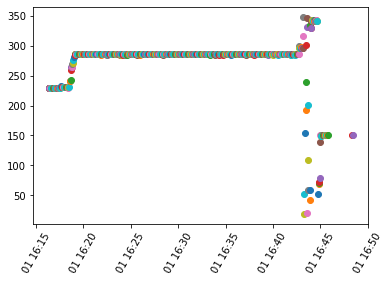

In [22]:
import datetime

for md in mds[:]:
    plt.scatter(datetime.datetime.strptime(md['UTC-Time'], '%H:%M:%S'), md['alta_yaw'])
    plt.xticks(rotation=60)


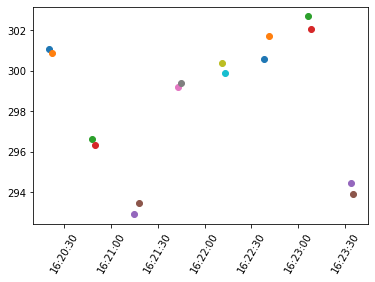

In [24]:
import datetime

for md in mds[int(80/10*2):int(160/10*2)]:
    plt.scatter(datetime.datetime.strptime(md['UTC-Time'], '%H:%M:%S'), md['yaw'])
    plt.xticks(rotation=60)

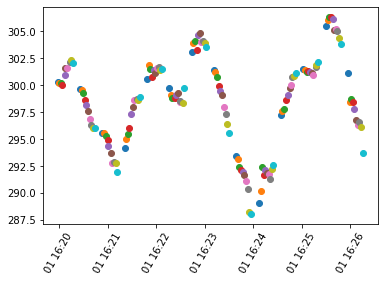

In [30]:
import datetime

for md in mds[80:220]:
    plt.scatter(datetime.datetime.strptime(md['UTC-Time'], '%H:%M:%S'), md['yaw'])
    plt.xticks(rotation=60)

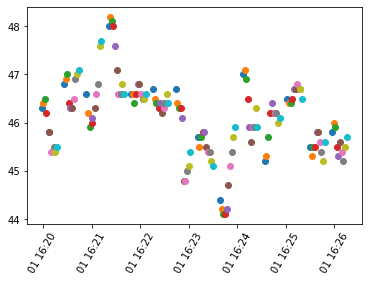

In [29]:
import datetime

for md in mds[80:220]:
    plt.scatter(datetime.datetime.strptime(md['UTC-Time'], '%H:%M:%S'), md['Altitude'])
    plt.xticks(rotation=60)

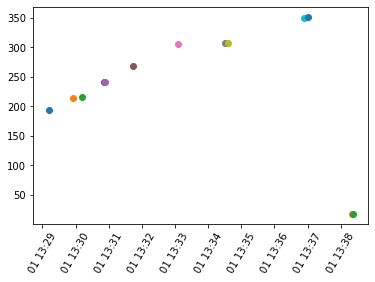

In [49]:
import datetime

for md in sky_img_metadata[2:]:
    plt.scatter(datetime.datetime.strptime(md['UTC-Time'], '%H:%M:%S'), md['yaw'])
    plt.xticks(rotation=60)

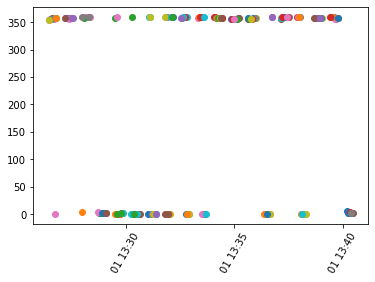

In [19]:
for md in mds:
    plt.scatter(datetime.datetime.strptime(md['UTC-Time'], '%H:%M:%S'), md['pitch'])
    plt.xticks(rotation=60)

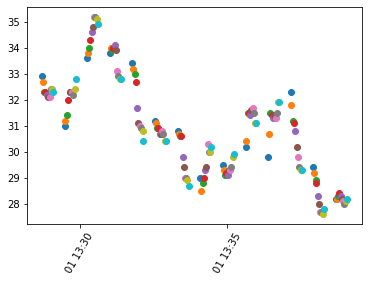

In [39]:
for md in mds[30:170]:
    plt.scatter(datetime.datetime.strptime(md['UTC-Time'], '%H:%M:%S'), md['Altitude'])
    plt.xticks(rotation=60)

In [23]:
sea_imgs.nbytes / 1e9

8.52913152

In [42]:
sky_imgs.nbytes / 1e9

NameError: name 'sky_imgs' is not defined

Inspect the bands either through time or sorted by pitch/yaw/lat/ etc

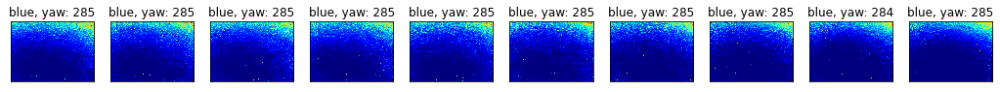

In [16]:
fig, ax = plt.subplots(1,10, figsize=(18,3))
for i in range(0,10):
    ax[i].set_title('blue, yaw: ' + str(int(sea_img_metadata[i]['alta_yaw'])))
    im = ax[i].imshow(sea_imgs[i][0], interpolation='none', 
                   cmap='jet', vmin=0.025, vmax=.06)
    ax[i].set_xticks([])
    ax[i].set_yticks([])


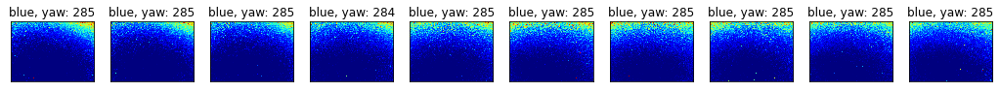

In [17]:
fig, ax = plt.subplots(1,10, figsize=(18,3))
for i in range(0,10):
    ax[i].set_title('blue, yaw: ' + str(int(sea_img_metadata[i+10]['alta_yaw'])))
    im = ax[i].imshow(sea_imgs[i+10][0], interpolation='none', 
                   cmap='jet', vmin=0.025, vmax=.06)
    ax[i].set_xticks([])
    ax[i].set_yticks([])


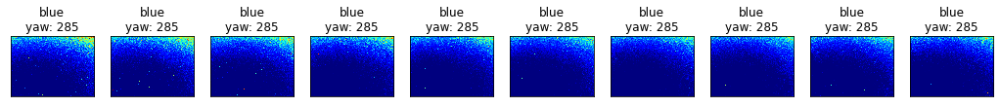

In [18]:
fig, ax = plt.subplots(1,10, figsize=(18,3))
for i in range(0,10):
    ax[i].set_title('blue\nyaw: ' + str(int(sea_img_metadata[i+20]['alta_yaw'])))
    im = ax[i].imshow(sea_imgs[i+20][0], interpolation='none', 
                   cmap='jet', vmin=0.025, vmax=.06)
    ax[i].set_xticks([])
    ax[i].set_yticks([])

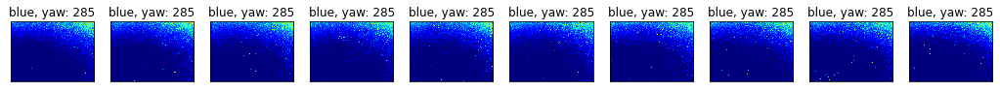

In [19]:
fig, ax = plt.subplots(1,10, figsize=(18,3))
for i in range(0,10):
    ax[i].set_title('blue, yaw: ' + str(int(sea_img_metadata[i+30]['alta_yaw'])))
    im = ax[i].imshow(sea_imgs[i+30][0], interpolation='none', 
                   cmap='jet', vmin=0.025, vmax=.06)
    ax[i].set_xticks([])
    ax[i].set_yticks([])

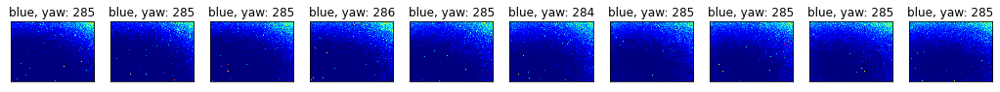

In [20]:
fig, ax = plt.subplots(1,10, figsize=(18,3))
for i in range(0,10):
    ax[i].set_title('blue, yaw: ' + str(int(sea_img_metadata[i+40]['alta_yaw'])))
    im = ax[i].imshow(sea_imgs[i+40][0], interpolation='none', 
                   cmap='jet', vmin=0.025, vmax=.06)
    ax[i].set_xticks([])
    ax[i].set_yticks([])

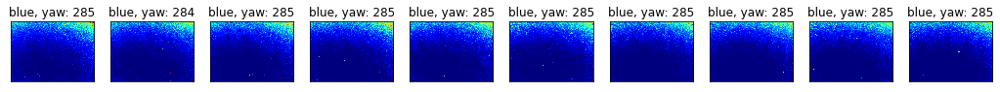

In [21]:
fig, ax = plt.subplots(1,10, figsize=(18,3))
for i in range(0,10):
    ax[i].set_title('blue, yaw: ' + str(int(sea_img_metadata[i+50]['alta_yaw'])))
    im = ax[i].imshow(sea_imgs[i+50][0], interpolation='none', 
                   cmap='jet', vmin=0.025, vmax=.06)
    ax[i].set_xticks([])
    ax[i].set_yticks([])

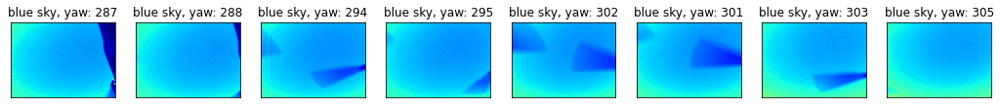

In [23]:
fig, ax = plt.subplots(1,8, figsize=(18,3))
for i in range(0,8):
    ax[i].set_title('blue sky, yaw: ' + str(int(sky_img_metadata[i]['yaw'])))
    im = ax[i].imshow(sky_imgs[i][0], interpolation='none', 
                   cmap='jet', vmin=0.0, vmax=.4)
    ax[i].set_xticks([])
    ax[i].set_yticks([])

IndexError: list index out of range

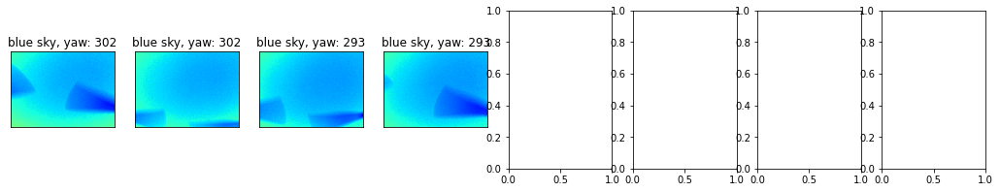

In [24]:
fig, ax = plt.subplots(1,8, figsize=(18,3))
for i in range(0,8):
    ax[i].set_title('blue sky, yaw: ' + str(int(sky_img_metadata[i+8]['yaw'])))
    im = ax[i].imshow(sky_imgs[i+8][0], interpolation='none', 
                   cmap='jet', vmin=0.0, vmax=.4)
    ax[i].set_xticks([])
    ax[i].set_yticks([])

### create medians of each image

In [19]:
sea_imgs.shape

(60, 6, 1469, 2016)

In [20]:
sea_median = np.median(sea_imgs[:15], axis=0)

In [27]:
#sky_median = np.median(sky_imgs, axis=0)
sky_median = sky_imgs[7]

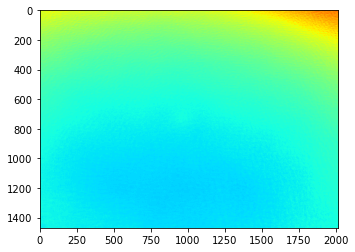

In [22]:
plt.imshow(sea_median[0], vmin=0.001,vmax=.02, cmap='jet')

In [23]:
plt.imshow(sky_median[0], vmin=0.01,vmax=.25, cmap='jet')

NameError: name 'sky_median' is not defined

#### inspect the sun blocked spectra based on the brightest pics there

brightest pixels used: 599
brightest pixels used: 599
brightest pixels used: 599
brightest pixels used: 599
brightest pixels used: 599


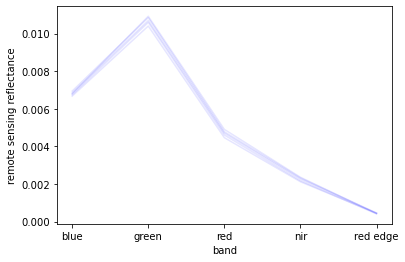

In [21]:
blocked_spectra = []
for i in range(0,5):
    spec = brightest_tube_pix(blocked_imgs[i], percent=0.0005)
    plt.plot(band_names, spec, color='blue', alpha=0.1)
    plt.ylabel('remote sensing reflectance')
    plt.xlabel('band')
    blocked_spectra.append(spec)
blocked_spectra = np.array(blocked_spectra)

In [22]:

panel_irradiance

[1.057098336950143,
 1.1128804208144099,
 0.9701722761988811,
 0.6248174090945774,
 0.7761155975397356]

brightest pixels used: 599
brightest pixels used: 599
brightest pixels used: 599
brightest pixels used: 599
brightest pixels used: 599


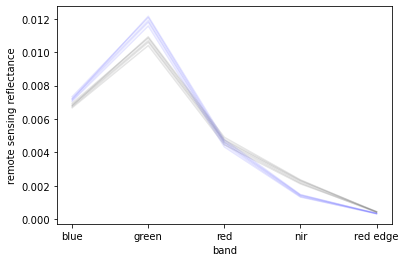

In [23]:
blocked_spectra = []
for i in range(0,5):
    spec = brightest_tube_pix(blocked_imgs[i], percent=0.0005)
    plt.plot(band_names, (spec*np.array(panel_irradiance)), color='blue', alpha=0.1)
    plt.plot(band_names, (np.array(spec)), color='black', alpha=0.1)
    plt.ylabel('remote sensing reflectance')
    plt.xlabel('band')
    blocked_spectra.append(spec)
blocked_spectra = np.array(blocked_spectra)

In [24]:
spec

[0.006672479836015253,
 0.010398149242005904,
 0.004459412391552608,
 0.002114386351145272,
 0.0004384619096173853]

In [81]:
# blocked_spectra = np.array([0.02136108, 0.0335728 , 0.01477112, 0.0070919 , 0.00137747])*.6
np.median(blocked_spectra,axis=0)

array([0.00679944, 0.01068655, 0.00470179, 0.00225742, 0.00043846])

In [82]:
np.median(sea_median, axis=(1,2))

array([0.00828608, 0.01391052, 0.00646956, 0.00403133, 0.00122397,
       0.27153675])

In [59]:
plt.imshow(((sea_median-blocked_spectra[0]) / sky_median[:,::-1,:2016])[0], vmin=0.025,vmax=.2, cmap='jet')

ValueError: operands could not be broadcast together with shapes (6,1469,2016) (5,) 

In [38]:
from georeg import *

In [47]:
((10 + 110 )/ 0.05) / 2

1200.0

In [55]:
120 / 0.05

2400.0

In [57]:
((70-30) / 0.05)

800.0

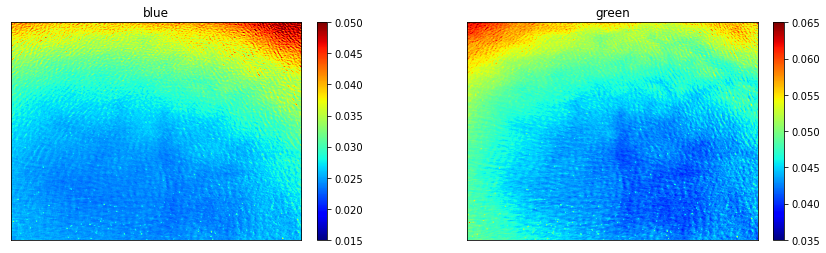

/home/clifgray/anaconda3/envs/micasense_ocean_color/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3427: FutureWarning: Indexing a timezone-naive DatetimeIndex with a timezone-aware datetime is deprecated and will raise KeyError in a future version.  Use a timezone-naive object instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


34.7138816 -76.6757056 47.83 -74.5 0 40
0.05
img coords:  [[ 258.3914646  2348.50889259]
 [ 686.43797456  805.02304135]
 [1762.20844904 1473.83633639]
 [1525.06358628 2328.95308621]]
initial profile
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 2064, 'height': 1544, 'count': 1, 'crs': None, 'transform': Affine(1.0, 0.0, 0.0,
       0.0, 1.0, 0.0), 'tiled': False, 'interleave': 'band'}
updated profile
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 4000, 'height': 4000, 'count': 1, 'crs': 'EPSG:4326', 'transform': Affine(3.5185429974500584e-12, 5.470247326852344e-07, -76.6767996560071,
       -4.4965761414818946e-07, 2.387899005108411e-12, 34.7147809111126), 'tiled': False, 'interleave': 'band'}
written out as  blue_georeg_finerLKLBZ1Ww6EphUE56L9ZR.tif
Complete!


/home/clifgray/Code/ocean_color/georeg.py:66: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  
/home/clifgray/anaconda3/envs/micasense_ocean_color/lib/python3.7/site-packages/rasterio/__init__.py:218: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/clifgray/anaconda3/envs/micasense_ocean_color/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3427: FutureWarning: Indexing a timezone-naive DatetimeIndex with a timezone-aware datetime is deprecated and will raise KeyError in a future version.  Use a timezone-naive object instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


34.7138816 -76.6757056 47.83 -74.5 0 40
0.05
img coords:  [[ 258.3914646  2348.50889259]
 [ 686.43797456  805.02304135]
 [1762.20844904 1473.83633639]
 [1525.06358628 2328.95308621]]
initial profile
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 2064, 'height': 1544, 'count': 1, 'crs': None, 'transform': Affine(1.0, 0.0, 0.0,
       0.0, 1.0, 0.0), 'tiled': False, 'interleave': 'band'}
updated profile
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 4000, 'height': 4000, 'count': 1, 'crs': 'EPSG:4326', 'transform': Affine(3.5185429974500584e-12, 5.470247326852344e-07, -76.6767996560071,
       -4.4965761414818946e-07, 2.387899005108411e-12, 34.7147809111126), 'tiled': False, 'interleave': 'band'}
written out as  green_georeg_finerLKLBZ1Ww6EphUE56L9ZR.tif
Complete!


/home/clifgray/Code/ocean_color/georeg.py:66: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  
/home/clifgray/anaconda3/envs/micasense_ocean_color/lib/python3.7/site-packages/rasterio/__init__.py:218: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


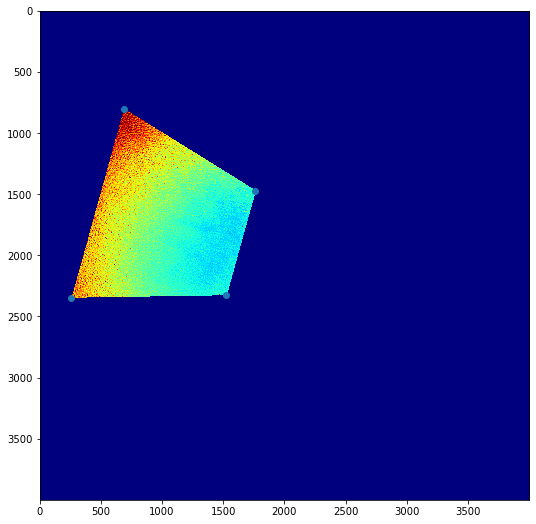

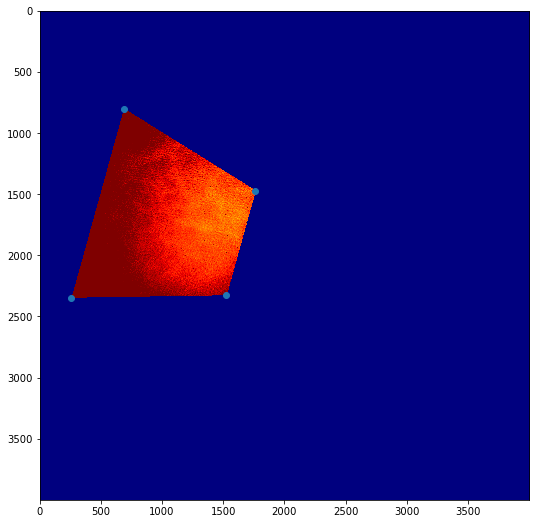

In [59]:
from skimage.transform import resize

for i in range(15):
    
    # form is [x_min, x_max, y_min, y_max]
    top_im_bounds=[-100,100,-100,100]
    
    original_img = plt.imread(sea_img_metadata[i]['image_name'])
    resized_blue = resize(sea_imgs[i,0], (original_img.shape[0], original_img.shape[1]), anti_aliasing=True)
    resized_green = resize(sea_imgs[i,1], (original_img.shape[0], original_img.shape[1]), anti_aliasing=True)
    
    resized_blue[resized_blue < 0] = 0
    resized_green[resized_green < 0] = 0
    
    fig, ax = plt.subplots(1,2, figsize=(15,4))
    im = ax[0].imshow(resized_blue,cmap='jet', vmin=0.015, vmax=.05)
    fig.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04)
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_title('blue')
    
    im = ax[1].imshow(resized_green,cmap='jet', vmin=0.035, vmax=.065)
    fig.colorbar(im, ax=ax[1], fraction=0.046, pad=0.04)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_title('green')
    plt.show()
    new_name = 'blue_georeg_finer' + sea_img_metadata[i]['filename']
    alta_micasense_georef(sea_img_metadata[i]['image_name'], new_name, resized_blue, alta_logs, top_im_bounds=top_im_bounds, scaling=0.05)
    new_name = 'green_georeg_finer' + sea_img_metadata[i]['filename']
    alta_micasense_georef(sea_img_metadata[i]['image_name'], new_name, resized_green, alta_logs, top_im_bounds=top_im_bounds, scaling=0.05)
    
    break

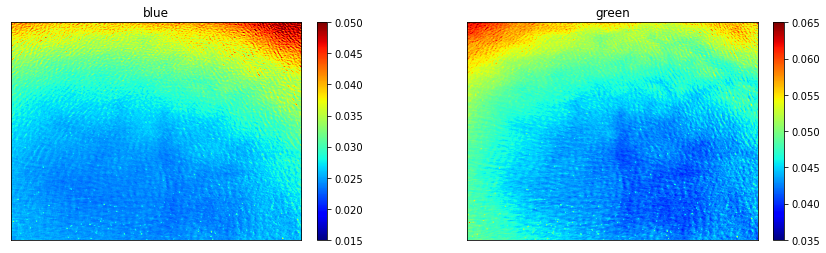

/home/clifgray/anaconda3/envs/micasense_ocean_color/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3427: FutureWarning: Indexing a timezone-naive DatetimeIndex with a timezone-aware datetime is deprecated and will raise KeyError in a future version.  Use a timezone-naive object instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


34.7138816 -76.6757056 47.83 -74.5 0 40
0.05
img coords:  [[-441.6085354  1548.50889259]
 [ -13.56202544    5.02304135]
 [1062.20844904  673.83633639]
 [ 825.06358628 1528.95308621]]
initial profile
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 2064, 'height': 1544, 'count': 1, 'crs': None, 'transform': Affine(1.0, 0.0, 0.0,
       0.0, 1.0, 0.0), 'tiled': False, 'interleave': 'band'}
updated profile
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 2600, 'height': 2400, 'count': 1, 'crs': 'EPSG:4326', 'transform': Affine(3.5185429974500584e-12, 5.470247326852344e-07, -76.67641673587939,
       -4.4965761414818946e-07, 2.387899005108411e-12, 34.7144211866928), 'tiled': False, 'interleave': 'band'}
written out as  blue_georeg_finerLKLBZ1Ww6EphUE56L9ZR.tif
Complete!
34.7138816 -76.6757056 47.83 -74.5 0 40
0.05


/home/clifgray/Code/ocean_color/georeg.py:66: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  
/home/clifgray/anaconda3/envs/micasense_ocean_color/lib/python3.7/site-packages/rasterio/__init__.py:218: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
/home/clifgray/anaconda3/envs/micasense_ocean_color/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3427: FutureWarning: Indexing a timezone-naive DatetimeIndex with a timezone-aware datetime is deprecated and will raise KeyError in a future version.  Use a timezone-naive object instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


img coords:  [[-441.6085354  1548.50889259]
 [ -13.56202544    5.02304135]
 [1062.20844904  673.83633639]
 [ 825.06358628 1528.95308621]]
initial profile
{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 2064, 'height': 1544, 'count': 1, 'crs': None, 'transform': Affine(1.0, 0.0, 0.0,
       0.0, 1.0, 0.0), 'tiled': False, 'interleave': 'band'}
updated profile
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 2600, 'height': 2400, 'count': 1, 'crs': 'EPSG:4326', 'transform': Affine(3.5185429974500584e-12, 5.470247326852344e-07, -76.67641673587939,
       -4.4965761414818946e-07, 2.387899005108411e-12, 34.7144211866928), 'tiled': False, 'interleave': 'band'}
written out as  green_georeg_finerLKLBZ1Ww6EphUE56L9ZR.tif
Complete!


/home/clifgray/Code/ocean_color/georeg.py:66: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  
/home/clifgray/anaconda3/envs/micasense_ocean_color/lib/python3.7/site-packages/rasterio/__init__.py:218: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


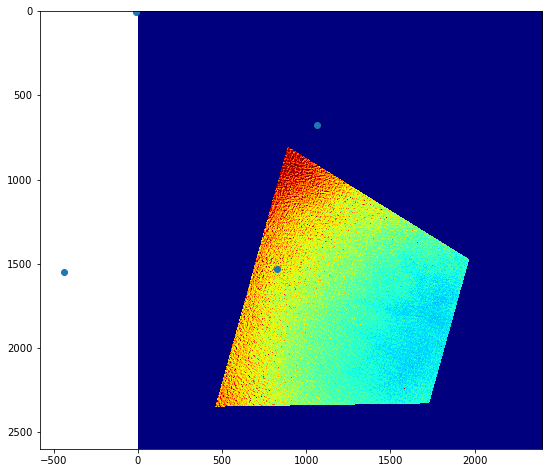

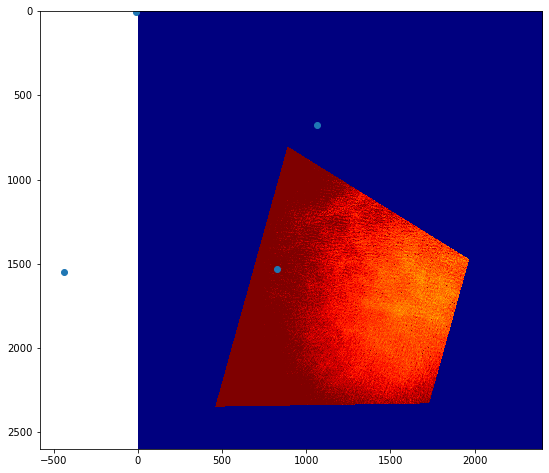

In [58]:
from skimage.transform import resize

for i in range(15):
    
    # form is [x_min, x_max, y_min, y_max]
    top_im_bounds=[-110,10,-30,100]
    x_center_offset = 10 - 110 / 0.05
    
    original_img = plt.imread(sea_img_metadata[i]['image_name'])
    resized_blue = resize(sea_imgs[i,0], (original_img.shape[0], original_img.shape[1]), anti_aliasing=True)
    resized_green = resize(sea_imgs[i,1], (original_img.shape[0], original_img.shape[1]), anti_aliasing=True)
    
    fig, ax = plt.subplots(1,2, figsize=(15,4))
    im = ax[0].imshow(resized_blue,cmap='jet', vmin=0.015, vmax=.05)
    fig.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04)
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_title('blue')
    
    im = ax[1].imshow(resized_green,cmap='jet', vmin=0.035, vmax=.065)
    fig.colorbar(im, ax=ax[1], fraction=0.046, pad=0.04)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_title('green')
    plt.show()
    new_name = 'blue_georeg_finer' + sea_img_metadata[i]['filename']
    alta_micasense_georef(sea_img_metadata[i]['image_name'], new_name, resized_blue, alta_logs, top_im_bounds=top_im_bounds, scaling=0.05)
    new_name = 'green_georeg_finer' + sea_img_metadata[i]['filename']
    alta_micasense_georef(sea_img_metadata[i]['image_name'], new_name, resized_green, alta_logs, top_im_bounds=top_im_bounds, scaling=0.05)
    
    break

### Correct for sun glint

### This is the current approach to calculating rho based on sunblocked spectra

Simple version

Take the blocked spectra and subtract that from Lt and then smooth that over and that is the correction to all the other images

Sea median - blocked_spectra is lsky * rho. So then to get Lw in the future all I need to do is subtract that from Lt

In [ ]:
Rrs = Lw / Ed

Lw = Rrs*Ed

In [25]:
blocked_spectra

array([[0.00679944, 0.01092057, 0.00490165, 0.00235446, 0.00042121],
       [0.00674675, 0.01059269, 0.00460074, 0.00216941, 0.00040372],
       [0.00693891, 0.010845  , 0.0047742 , 0.00231653, 0.00045293],
       [0.00684064, 0.01068655, 0.00470179, 0.00225742, 0.00044396],
       [0.00667248, 0.01039815, 0.00445941, 0.00211439, 0.00043846]])

In [26]:
smoothed_lt_lw = ndimage.gaussian_filter(((sea_median[:5,:,:].T - np.median(blocked_spectra, axis=0)).T), sigma=(0, 45, 45), order=0)

In [27]:
smoothed_lt_lw.shape

(5, 1469, 2016)

Visualize the sea median bands

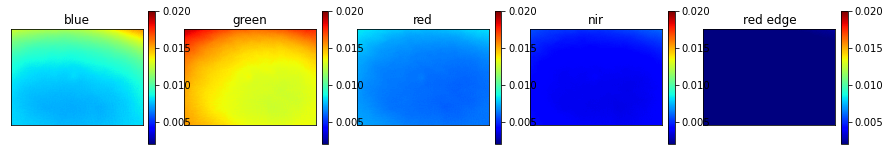

In [36]:
fig, ax = plt.subplots(1,5, figsize=(15,4))
for i in range(5):
    im = ax[i].imshow(sea_median[i],cmap='jet', vmin=0.002, vmax=.02)
    fig.colorbar(im, ax=ax[i], fraction=0.046, pad=0.04)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(band_names[i])

In [42]:
panel_irradiance

[1.057098336950143,
 1.1128804208144099,
 0.9701722761988811,
 0.6248174090945774,
 0.7761155975397356]

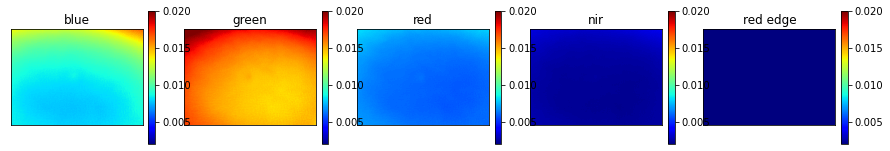

In [41]:
fig, ax = plt.subplots(1,5, figsize=(15,4))
for i in range(5):
    im = ax[i].imshow(sea_median[i]*panel_irradiance[i],cmap='jet', vmin=0.002, vmax=.02)
    fig.colorbar(im, ax=ax[i], fraction=0.046, pad=0.04)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(band_names[i])

Sea median images divided by image mean

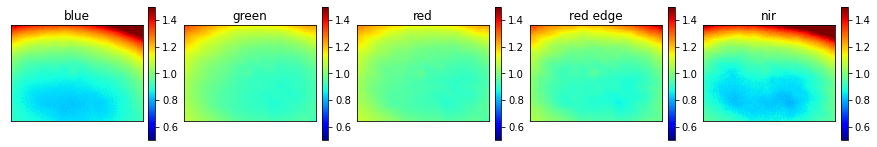

In [86]:
fig, ax = plt.subplots(1,5, figsize=(15,4))
for i in range(5):
    im = ax[i].imshow(sea_median[i]/np.mean(sea_median[i]),cmap='jet', vmin=0.5, vmax=1.5)
    fig.colorbar(im, ax=ax[i], fraction=0.046, pad=0.04)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(band_names[i])

Sea median images

NameError: name 'sky_median' is not defined

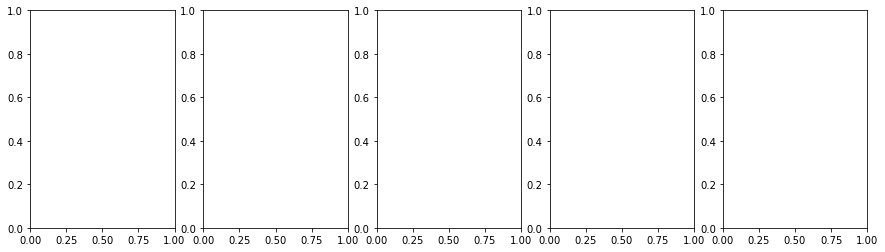

In [68]:
fig, ax = plt.subplots(1,5, figsize=(15,4))
for i in range(5):
    im = ax[i].imshow(sky_median[i],cmap='jet', vmin=0.003, vmax=.2)
    fig.colorbar(im, ax=ax[i], fraction=0.046, pad=0.04)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(band_names[i])

Sky median divided by the mean sky median

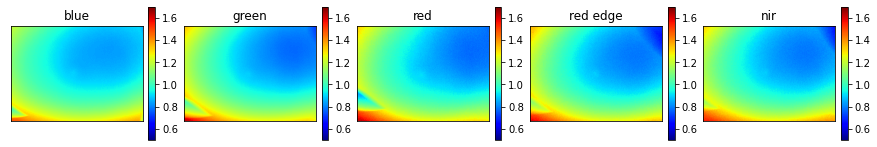

In [28]:
fig, ax = plt.subplots(1,5, figsize=(15,4))
for i in range(5):
    im = ax[i].imshow(sky_median[i]/np.mean(sky_median[i]),cmap='jet', vmin=.5, vmax=1.7)
    fig.colorbar(im, ax=ax[i], fraction=0.046, pad=0.04)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(band_names[i])

Smoothed lt - lw images (aka rho*lsky)

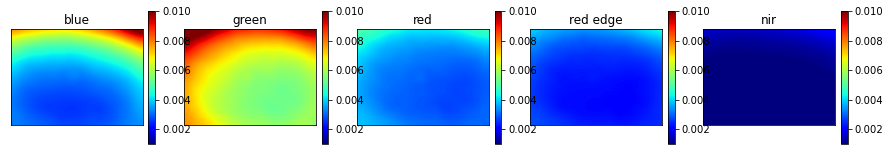

In [70]:
fig, ax = plt.subplots(1,5, figsize=(15,4))
for i in range(5):
    im = ax[i].imshow(smoothed_lt_lw[i],cmap='jet', vmin=0.001, vmax=.01)
    fig.colorbar(im, ax=ax[i], fraction=0.046, pad=0.04)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(band_names[i])

lt - lw divided buy the mean of that

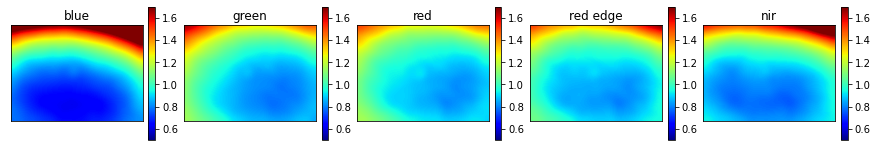

In [71]:
fig, ax = plt.subplots(1,5, figsize=(15,4))
for i in range(5):
    im = ax[i].imshow(smoothed_lt_lw[i]/np.mean(smoothed_lt_lw[i]),cmap='jet', vmin=.5, vmax=1.7)
    fig.colorbar(im, ax=ax[i], fraction=0.046, pad=0.04)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(band_names[i])

lt-lw divided by lsky which is effectively rho

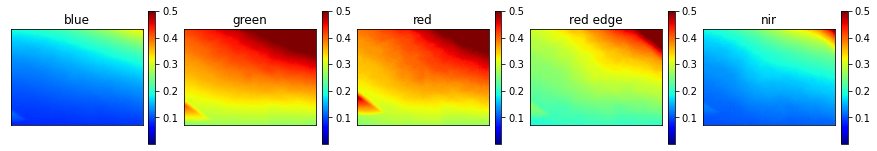

In [31]:
fig, ax = plt.subplots(1,5, figsize=(15,4))
for i in range(5):
    im = ax[i].imshow(smoothed_lt_lw[i]/sky_median[i,:,:2016],cmap='jet', vmin=0.001, vmax=.5)
    fig.colorbar(im, ax=ax[i], fraction=0.046, pad=0.04)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(band_names[i])

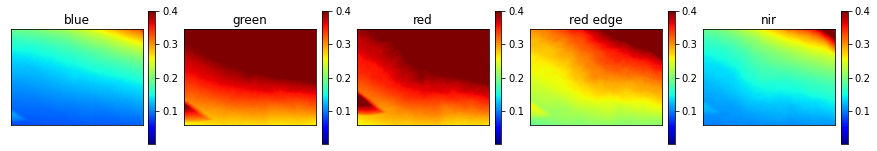

In [32]:
fig, ax = plt.subplots(1,5, figsize=(15,4))
for i in range(5):
    im = ax[i].imshow(smoothed_lt_lw[i]/sky_median[i,:,:2016],cmap='jet', vmin=0.001, vmax=.4)
    fig.colorbar(im, ax=ax[i], fraction=0.046, pad=0.04)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(band_names[i])

### Apply simple approach

just take smoothed_lt_lw and subtract it from the lt images

/home/clifgray/Code/ocean_color/utils.py:434: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/clifgray/Code/ocean_color/utils.py:421: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,5, figsize=(16,14))


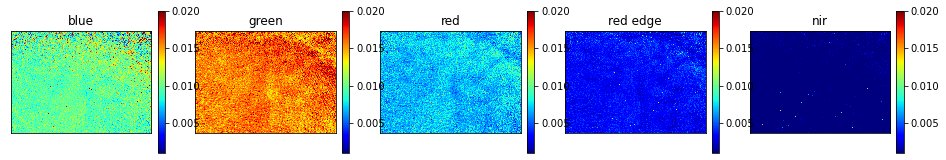

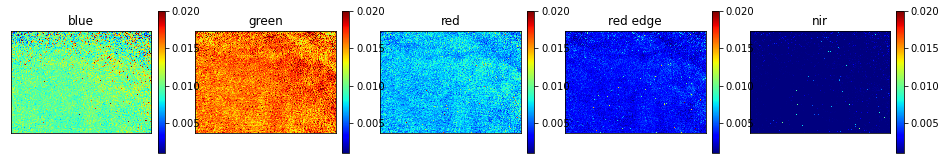

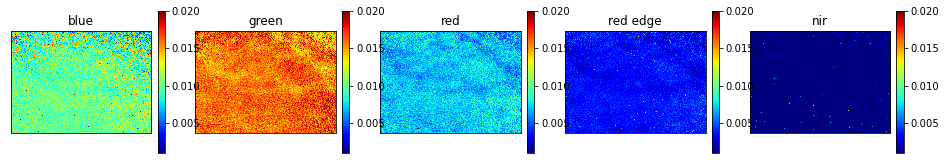

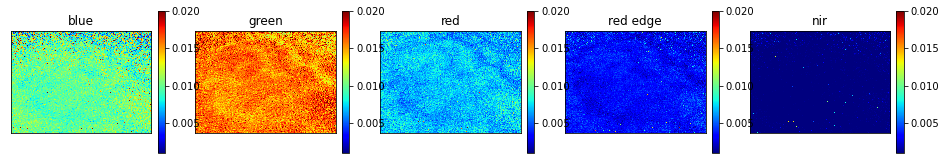

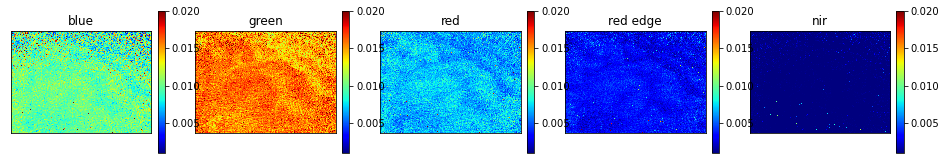

...

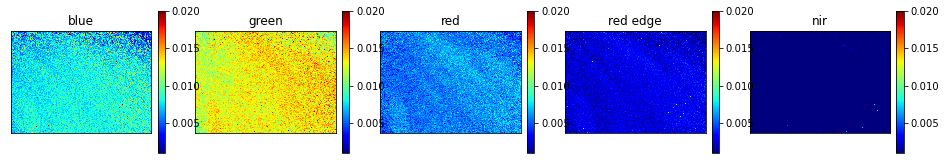

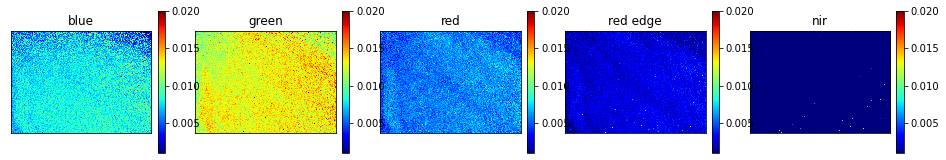

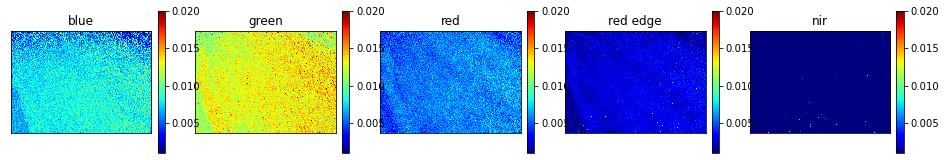

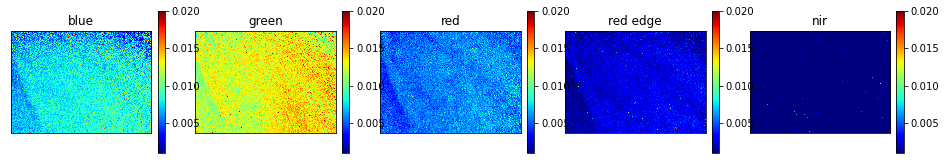

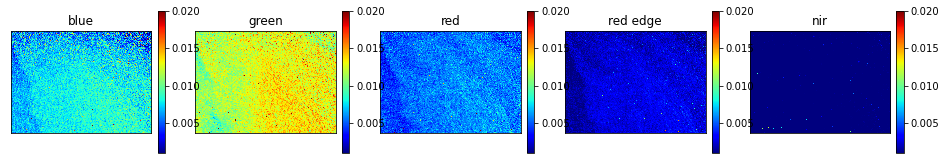

In [83]:
for i in range(30):
    visualize_darkest_pixels(sea_imgs[i,:5] - smoothed_lt_lw, lowest_percent=1, max_clim=0.02, min_clim=0.001, only_img=True)

(array([3.00000e+00, 3.00000e+00, 1.00000e+00, 3.10000e+01, 2.28000e+02,
        2.52900e+03, 1.86270e+04, 1.01673e+05, 3.76946e+05, 8.24428e+05,
        8.74406e+05, 4.44515e+05, 1.58309e+05, 6.66250e+04, 3.57230e+04,
        2.07860e+04, 1.29460e+04, 8.35200e+03, 5.39400e+03, 3.47800e+03,
        2.18300e+03, 1.46100e+03, 9.09000e+02, 5.96000e+02, 3.93000e+02,
        2.91000e+02, 1.39000e+02, 1.36000e+02, 8.50000e+01, 6.20000e+01]),
 array([0.00326406, 0.00432127, 0.00537848, 0.00643569, 0.0074929 ,
        0.00855011, 0.00960731, 0.01066452, 0.01172173, 0.01277894,
        0.01383615, 0.01489336, 0.01595057, 0.01700778, 0.01806499,
        0.0191222 , 0.02017941, 0.02123662, 0.02229383, 0.02335104,
        0.02440825, 0.02546545, 0.02652266, 0.02757987, 0.02863708,
        0.02969429, 0.0307515 , 0.03180871, 0.03286592, 0.03392313,
        0.03498034]),
 <BarContainer object of 30 artists>)

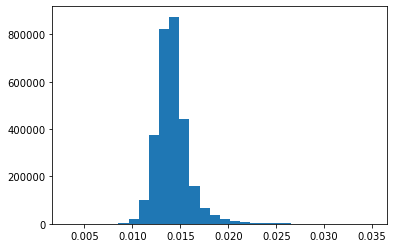

In [94]:
plt.hist(img[1].flatten(), bins=30)

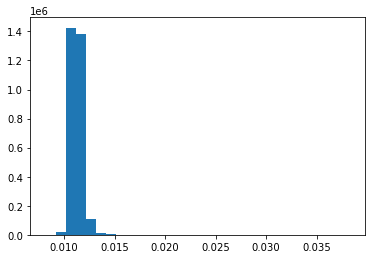

In [94]:
img = sea_imgs[0,:5] - smoothed_lt_lw[:]

plt.hist(img[1].flatten(), bins=30)
plt.show()

In [100]:
img = sea_imgs[5,:5] - smoothed_lt_lw[:]
np.mean(img[1]) + np.std(img[1])*4

0.013137412506905123

In [101]:
np.std(img[1])

0.0005392862609830223

In [46]:
sea_median.shape

(6, 1469, 2016)

In [37]:
plt.rcParams.update({'font.size': 14})

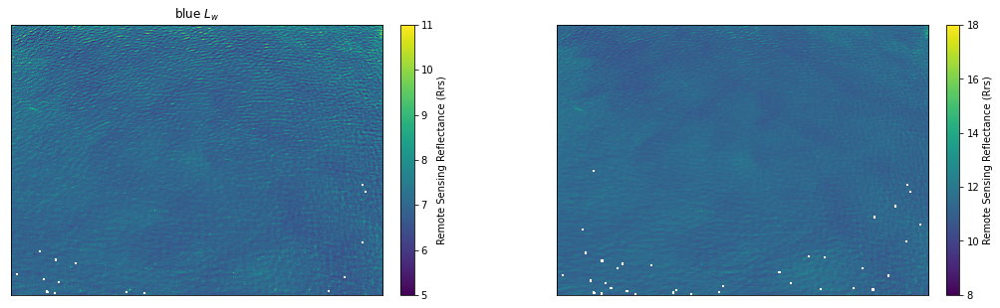

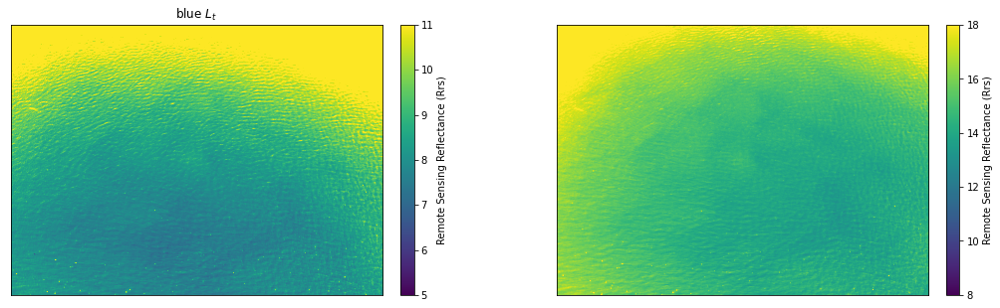

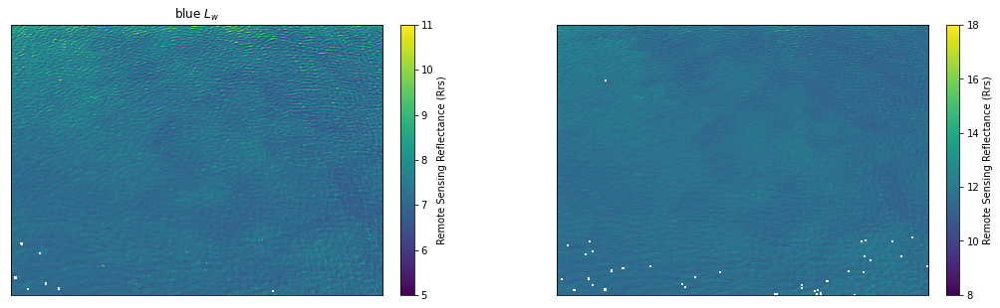

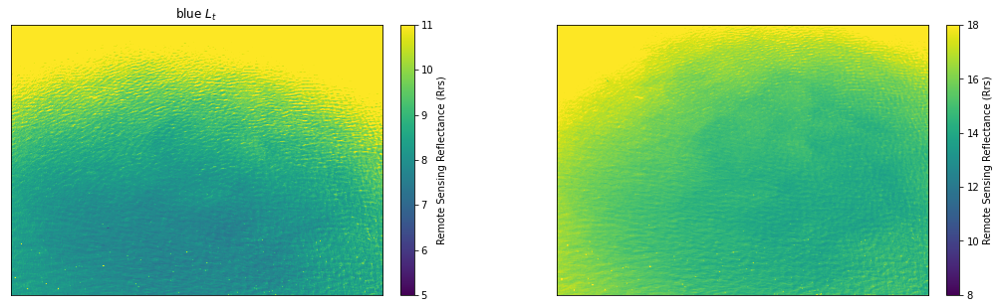

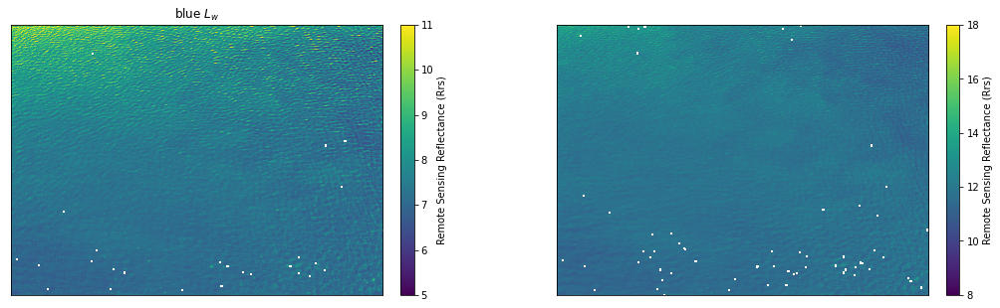

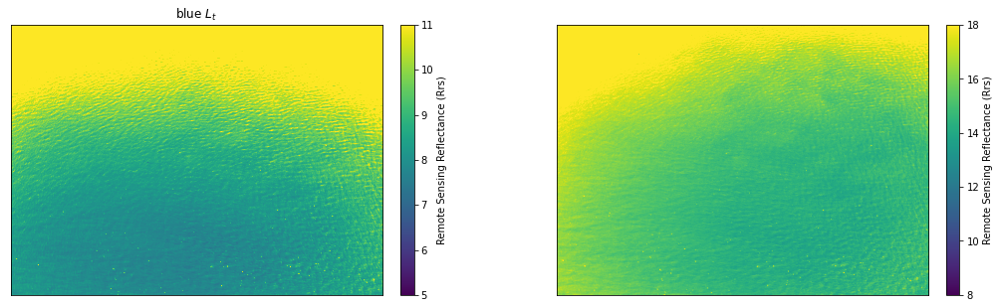

In [84]:
for i in range(12,15):
    fig, ax = plt.subplots(1,2, figsize=(18,5))
    img = sea_imgs[i,:5] - smoothed_lt_lw
    
    img[img > 0.018] = np.nan
    
    
    im = ax[0].imshow(img[0]*panel_irradiance[0]*1000,cmap='viridis', vmin=5, vmax=11)
    cbar = fig.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04)
    cbar.set_label('Remote Sensing Reflectance (Rrs)')
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    #ax[0].set_title('blue lw\nyaw: ' + str(sea_img_metadata[i]['yaw']) + '\naltitude: ' + str(sea_img_metadata[i]['Altitude']))
    ax[0].set_title('blue $L_{w}$')
    im = ax[1].imshow(img[1]*panel_irradiance[1]*1000,cmap='viridis', vmin=8, vmax=18)
    cbar = fig.colorbar(im, ax=ax[1], fraction=0.046, pad=0.04)
    cbar.set_label('Remote Sensing Reflectance (Rrs)')
    ax[1].set_xticks([])
    ax[1].set_yticks([])
#     ax[1].set_title('green $L_{w}$')
#     plt.savefig('oc_analysis_20210304_duml_newgimbal_mapping_testing_lw_img_revision1.png', dpi=300)
    plt.show()
    
    fig, ax = plt.subplots(1,2, figsize=(18,5))
    
    im = ax[0].imshow(sea_imgs[i,0]*panel_irradiance[0]*1000,cmap='viridis', vmin=5, vmax=11)
    cbar = fig.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04)
    cbar.set_label('Remote Sensing Reflectance (Rrs)')
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_title('blue $L_{t}$')
    im = ax[1].imshow(sea_imgs[i, 1]*panel_irradiance[1]*1000,cmap='viridis', vmin=8, vmax=18)
    cbar = fig.colorbar(im, ax=ax[1], fraction=0.046, pad=0.04)
    cbar.set_label('Remote Sensing Reflectance (Rrs)')
    ax[1].set_xticks([])
    ax[1].set_yticks([])
#     ax[1].set_title('green $L_{t}$')
    
#     plt.savefig('oc_analysis_20210304_duml_newgimbal_mapping_testing_lt_img_revision1.png', dpi=300)
    plt.show()

In [28]:
img_num = 12

In [29]:
img = sea_imgs[img_num,:5] - smoothed_lt_lw
    
img[img > 0.018] = np.nan

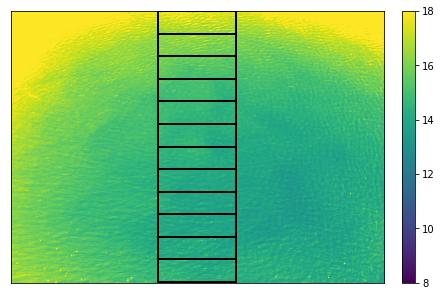

In [30]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(figsize=(8,5))

# Display the image
im= ax.imshow(sea_imgs[img_num,1]*panel_irradiance[1]*1000, cmap='viridis', vmin=8, vmax=18)
# sea_imgs[38,0,i-122:i,797:-797]
fig.colorbar(im,fraction=0.046, pad=0.04)
# patches.Rectangle(xy, width, height, angle=0.0, **kwargs)
# Create a Rectangle patch
# rect = patches.Rectangle((797, 0), 420, 1470, linewidth=3, edgecolor='grey', facecolor='none')
# # Add the patch to the Axes
# ax.add_patch(rect)

ax.axes.get_xaxis().set_ticks([])
ax.axes.get_yaxis().set_ticks([])

for i in range(0,1470,122):
    rect = patches.Rectangle((797, i), 420, 122, linewidth=2, edgecolor='black', facecolor='none', ls='-')
    # Add the patch to the Axes
    ax.add_patch(rect)

# fig.savefig('sections_for_vg_analysis_lt.png', dpi=300)
plt.show()

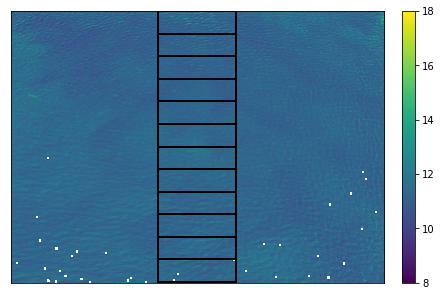

In [31]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(figsize=(8,5))

# Display the image
im= ax.imshow(img[1]*panel_irradiance[1]*1000,cmap='viridis', vmin=8, vmax=18)
# sea_imgs[38,0,i-122:i,797:-797]
fig.colorbar(im,fraction=0.046, pad=0.04)
# patches.Rectangle(xy, width, height, angle=0.0, **kwargs)
# Create a Rectangle patch
# rect = patches.Rectangle((797, 0), 420, 1470, linewidth=3, edgecolor='grey', facecolor='none')
# # Add the patch to the Axes
# ax.add_patch(rect)

ax.axes.get_xaxis().set_ticks([])
ax.axes.get_yaxis().set_ticks([])

for i in range(0,1470,122):
    rect = patches.Rectangle((797, i), 420, 122, linewidth=2, edgecolor='black', facecolor='none', ls='-')
    # Add the patch to the Axes
    ax.add_patch(rect)
    
# fig.savefig('sections_for_vg_analysis_lw.png', dpi=300)
plt.show()

In [32]:
plt.rcParams.update({'font.size': 13.7})

Text(0.5, 0, 'Degrees from Nadir')

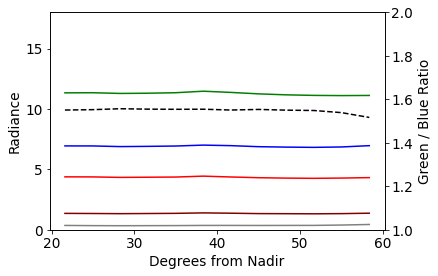

In [33]:
blue_medians = []
green_medians = []
red_medians = []
nir_medians = []
re_medians = []
for i in range(1470,122,-122):
    blue_medians.append(np.nanmedian(img[0,i-122:i,797:-797]))
    green_medians.append(np.nanmedian(img[1,i-122:i,797:-797]))
    red_medians.append(np.nanmedian(img[2,i-122:i,797:-797]))
    nir_medians.append(np.nanmedian(img[3,i-122:i,797:-797]))
    re_medians.append(np.nanmedian(img[4,i-122:i,797:-797]))

blue_medians = np.array(blue_medians)
green_medians = np.array(green_medians)
red_medians = np.array(red_medians)
nir_medians = np.array(nir_medians)
re_medians = np.array(re_medians)

# this creates 12 evenly spaced nums each at the center of the boxes
degrees = np.linspace(40-36.8/2,40+36.8/2,12)

fig, ax = plt.subplots()
ax.plot(degrees,blue_medians*panel_irradiance[0]*1000, color='blue')
ax.plot(degrees,green_medians*panel_irradiance[1]*1000, color='green')
ax.plot(degrees,red_medians*panel_irradiance[2]*1000, color='red')
ax.plot(degrees,nir_medians*panel_irradiance[3]*1000, color='maroon')
ax.plot(degrees,re_medians*panel_irradiance[4]*1000, color='grey')

ax.set_ylim(0,18)

ax2 = ax.twinx()
ax.set_ylabel('Radiance')
ax2.set_ylabel('Green / Blue Ratio')

ax2.plot(degrees,green_medians/blue_medians, color='black', ls='--')
# ax2.plot(red_medians/blue_medians, color='black')
ax2.set_ylim(1,2)
ax.set_xlabel('Degrees from Nadir')
# fig.savefig('spectral_changes_with_va_lw.png',dpi=300)

In [34]:
img.shape

(5, 1469, 2016)

In [35]:
1469 / 36.8

39.91847826086957

In [36]:
50/40*2

2.5

In [37]:
np.arange(100,800,100) / 40 * 2

array([ 5., 10., 15., 20., 25., 30., 35.])

In [38]:
list(range(1470,122,-122))

[1470, 1348, 1226, 1104, 982, 860, 738, 616, 494, 372, 250, 128]

Text(0.5, 0, 'Degrees from Nadir')

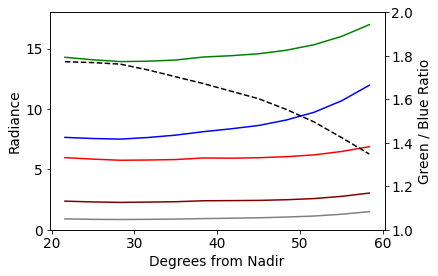

In [39]:
blue_medians = []
green_medians = []
red_medians = []
nir_medians = []
re_medians = []
for i in range(1470,122,-122):
    blue_medians.append(np.median(sea_imgs[img_num,0,i-122:i,797:-797]))
    green_medians.append(np.median(sea_imgs[img_num,1,i-122:i,797:-797]))
    red_medians.append(np.median(sea_imgs[img_num,2,i-122:i,797:-797]))
    nir_medians.append(np.median(sea_imgs[img_num,3,i-122:i,797:-797]))
    re_medians.append(np.median(sea_imgs[img_num,4,i-122:i,797:-797]))

blue_medians = np.array(blue_medians)
green_medians = np.array(green_medians)
red_medians = np.array(red_medians)
nir_medians = np.array(nir_medians)
re_medians = np.array(re_medians)

# this creates 12 evenly spaced nums each at the center of the boxes
degrees = np.linspace(40-36.8/2,40+36.8/2,12)

fig, ax = plt.subplots()
ax.plot(degrees,blue_medians*panel_irradiance[0]*1000, color='blue')
ax.plot(degrees,green_medians*panel_irradiance[1]*1000, color='green')
ax.plot(degrees,red_medians*panel_irradiance[2]*1000, color='red')
ax.plot(degrees,nir_medians*panel_irradiance[3]*1000, color='maroon')
ax.plot(degrees,re_medians*panel_irradiance[4]*1000, color='grey')

ax.set_ylim(0,18)

ax2 = ax.twinx()
ax.set_ylabel('Radiance')
ax2.set_ylabel('Green / Blue Ratio')

# ax3 = ax.twinx()
# ax3.set_ylim(0,7)

# ax3.plot(degrees, vec_chla_img(blue_medians*panel_irradiance[0], green_medians*panel_irradiance[1]),c='green')

ax2.plot(degrees,green_medians/blue_medians, color='black', ls='--')
# ax2.plot(red_medians/blue_medians, color='black')
ax2.set_ylim(1,2)
ax.set_xlabel('Degrees from Nadir')
# fig.savefig('spectral_changes_with_va_lt.png',dpi=300)

In [40]:
vec_chla_img(blue_medians*panel_irradiance[0], green_medians*panel_irradiance[1])

array([6.01079721, 5.97918482, 5.92542942, 5.72365627, 5.49123094,
       5.26506777, 5.01781408, 4.77864427, 4.45125031, 4.08639585,
       3.65359078, 3.23379637])

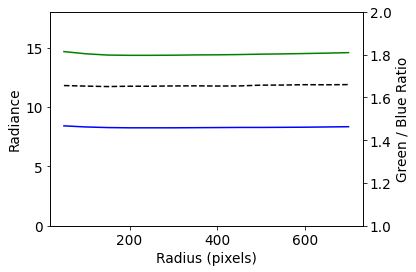

In [43]:
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = (int(w/2), int(h/2))
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    mask = dist_from_center <= radius
    return mask

blue_radial_medians = []
green_radial_medians = []
radiuses = list(range(50,750,50))
for i in radiuses:
    mask = create_circular_mask(1469, 2016, radius=i)
    blue_radial_medians.append(np.median(sea_imgs[img_num, 0,:,:][mask]))
    green_radial_medians.append(np.median(sea_imgs[img_num, 1,:,:][mask]))
    
blue_radial_medians = np.array(blue_radial_medians)
green_radial_medians = np.array(green_radial_medians)

fig, ax = plt.subplots()
ax.plot(radiuses,blue_radial_medians*panel_irradiance[0]*1000,color='blue')
ax.plot(radiuses,green_radial_medians*panel_irradiance[1]*1000,color='green')

ax2 = ax.twinx()
ax2.plot(radiuses,green_radial_medians/blue_radial_medians,color='black', ls='--')

ax.set_ylim(0,18)
ax2.set_ylim(1,2)

# ax2.plot(blue_radial_medians, color='blue', alpha=0.3, ls='--')
# ax3 = ax.twinx()
# ax3.plot(green_radial_medians, color='green', alpha=0.3, ls='--')
# ax3.spines['right'].set_position(('outward', 70))
ax.set_ylabel('Radiance')
ax.set_xlabel('Radius (pixels)')
ax2.set_ylabel('Green / Blue Ratio')
fig.tight_layout()
fig.savefig('radial_changes_lt.png', dpi=300)
plt.show()

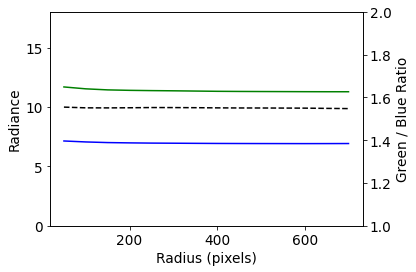

In [44]:

blue_radial_medians = []
green_radial_medians = []
radiuses = list(range(50,750,50))
for i in radiuses:
    mask = create_circular_mask(1469, 2016, radius=i)
    blue_radial_medians.append(np.nanmedian(img[0,:,:][mask]))
    green_radial_medians.append(np.nanmedian(img[1,:,:][mask]))
    
blue_radial_medians = np.array(blue_radial_medians)
green_radial_medians = np.array(green_radial_medians)

fig, ax = plt.subplots()
ax.plot(radiuses,blue_radial_medians*panel_irradiance[0]*1000,color='blue')
ax.plot(radiuses,green_radial_medians*panel_irradiance[1]*1000,color='green')

ax2 = ax.twinx()
ax2.plot(radiuses,green_radial_medians/blue_radial_medians,color='black', ls='--')

ax.set_ylim(0,18)
ax2.set_ylim(1,2)

# ax2.plot(blue_radial_medians, color='blue', alpha=0.3, ls='--')
# ax3 = ax.twinx()
# ax3.plot(green_radial_medians, color='green', alpha=0.3, ls='--')
# ax3.spines['right'].set_position(('outward', 70))
ax.set_ylabel('Radiance')
ax.set_xlabel('Radius (pixels)')
ax2.set_ylabel('Green / Blue Ratio')
fig.tight_layout()
fig.savefig('radial_changes_lw.png', dpi=300)
plt.show()

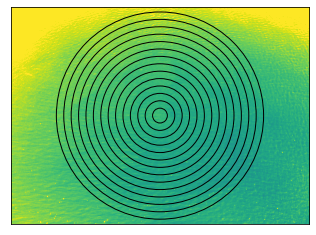

In [170]:
from matplotlib.patches import Circle
fig, ax = plt.subplots()
ax.imshow(sea_imgs[img_num,1]*panel_irradiance[1]*1000,cmap='viridis', vmin=8, vmax=18)

x,y = (int(2016/2), int(1469/2))

ax.axes.get_xaxis().set_ticks([])
ax.axes.get_yaxis().set_ticks([])

# Now, loop through coord arrays, and create a circle at each x,y pair
for i in radiuses:
    circ = Circle((x,y),radius=i, edgecolor='black', facecolor='none')
    ax.add_patch(circ)

# Show the image
fig.savefig('radial_overlay_lt.png', dpi=300)
plt.show()

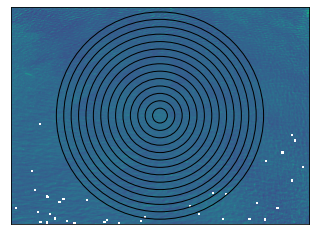

In [169]:
from matplotlib.patches import Circle
fig, ax = plt.subplots()
ax.imshow(img[1]*panel_irradiance[1]*1000,cmap='viridis', vmin=8, vmax=18)

x,y = (int(2016/2), int(1469/2))

ax.axes.get_xaxis().set_ticks([])
ax.axes.get_yaxis().set_ticks([])

# Now, loop through coord arrays, and create a circle at each x,y pair
for i in radiuses:
    circ = Circle((x,y),radius=i, edgecolor='black', facecolor='none')
    ax.add_patch(circ)

# Show the image
fig.savefig('radial_overlay_lw.png', dpi=300)
plt.show()

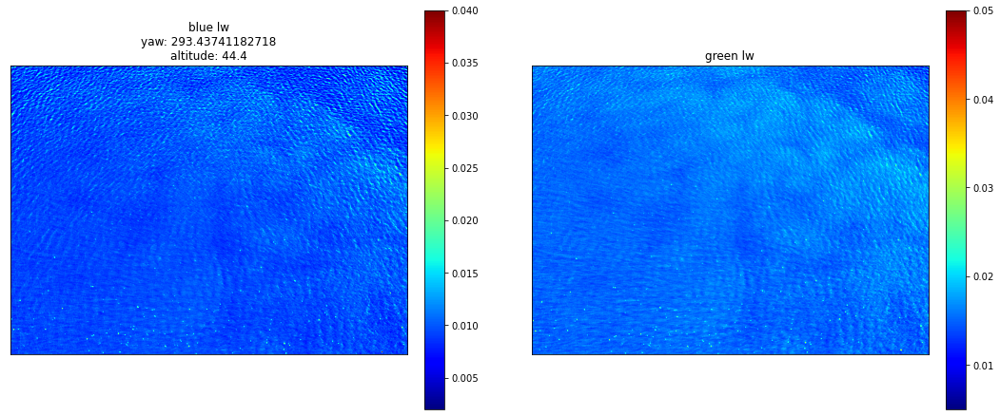

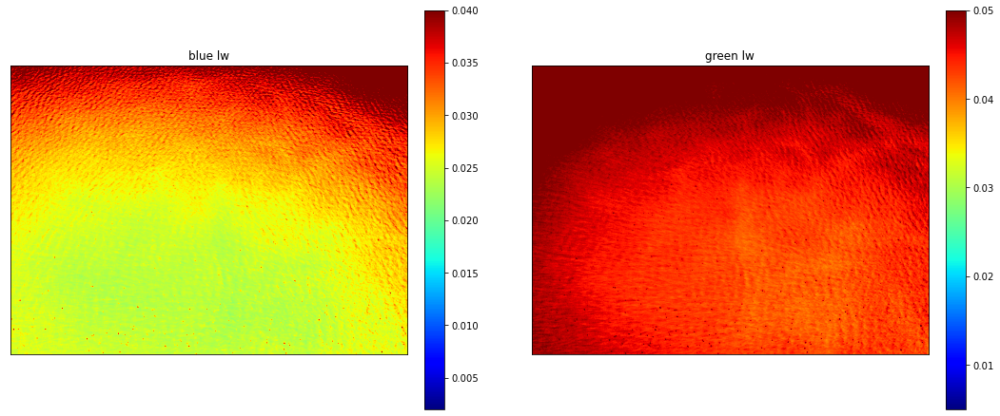

In [47]:
for i in range(15):
    fig, ax = plt.subplots(1,2, figsize=(18,8))
    img = sea_imgs[i,:5] - smoothed_lt_lw
    
    #img[img > 0.035] = np.nan
    
    
    im = ax[0].imshow(img[0],cmap='jet', vmin=0.002, vmax=.04)
    fig.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04)
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_title('blue lw\nyaw: ' + str(sea_img_metadata[i]['yaw']) + '\naltitude: ' + str(sea_img_metadata[i]['Altitude']))
    im = ax[1].imshow(img[1],cmap='jet', vmin=0.005, vmax=.05)
    fig.colorbar(im, ax=ax[1], fraction=0.046, pad=0.04)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_title('green lw')
    plt.show()
    
    fig, ax = plt.subplots(1,2, figsize=(18,8))
    
    im = ax[0].imshow(sea_imgs[i,0],cmap='jet', vmin=0.002, vmax=.04)
    fig.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04)
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_title('blue lw')
    im = ax[1].imshow(sea_imgs[i, 1],cmap='jet', vmin=0.005, vmax=.05)
    fig.colorbar(im, ax=ax[1], fraction=0.046, pad=0.04)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_title('green lw')
    plt.show()
    
    break
    
    original_img = plt.imread(sea_img_metadata[i]['image_name'])
    resized_blue = resize(img[0], (original_img.shape[0], original_img.shape[1]), anti_aliasing=True)
    resized_green = resize(img[1], (original_img.shape[0], original_img.shape[1]), anti_aliasing=True)
    
    new_name = 'lw_blue_georeg_finer' + sea_img_metadata[i]['filename']
    alta_micasense_georef(sea_img_metadata[i]['image_name'], new_name, resized_blue, alta_logs, scaling=0.05)
    new_name = 'lw_green_georeg_finer' + sea_img_metadata[i]['filename']
    alta_micasense_georef(sea_img_metadata[i]['image_name'], new_name, resized_green, alta_logs, scaling=0.05)
    break
    
    
from skimage.transform import resize

for i in range(15):
    
    # form is [x_min, x_max, y_min, y_max]
    top_im_bounds=[-100,100,-100,100]
    
    original_img = plt.imread(sea_img_metadata[i]['image_name'])
    resized_blue = resize(sea_imgs[i,0], (original_img.shape[0], original_img.shape[1]), anti_aliasing=True)
    resized_green = resize(sea_imgs[i,1], (original_img.shape[0], original_img.shape[1]), anti_aliasing=True)
    
    smoothed_lt_lw
    resized_blue[resized_blue < 0] = 0
    resized_green[resized_green < 0] = 0
    
    fig, ax = plt.subplots(1,2, figsize=(15,4))
    im = ax[0].imshow(resized_blue,cmap='jet', vmin=0.015, vmax=.05)
    fig.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04)
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_title('blue')
    
    im = ax[1].imshow(resized_green,cmap='jet', vmin=0.035, vmax=.065)
    fig.colorbar(im, ax=ax[1], fraction=0.046, pad=0.04)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_title('green')
    plt.show()
    new_name = 'blue_georeg_finer' + sea_img_metadata[i]['filename']
    alta_micasense_georef(sea_img_metadata[i]['image_name'], new_name, resized_blue, alta_logs, top_im_bounds=top_im_bounds, scaling=0.05)
    new_name = 'green_georeg_finer' + sea_img_metadata[i]['filename']
    alta_micasense_georef(sea_img_metadata[i]['image_name'], new_name, resized_green, alta_logs, top_im_bounds=top_im_bounds, scaling=0.05)
    
    break

#### Inspect the spectra from this

In [144]:
chla_lw = vec_chla_img(lw_imgs[8,0], lw_imgs[8,1])

/home/clifgray/anaconda3/envs/micasense_ocean_color/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log10
  # This is added back by InteractiveShellApp.init_path()


293.43741182718


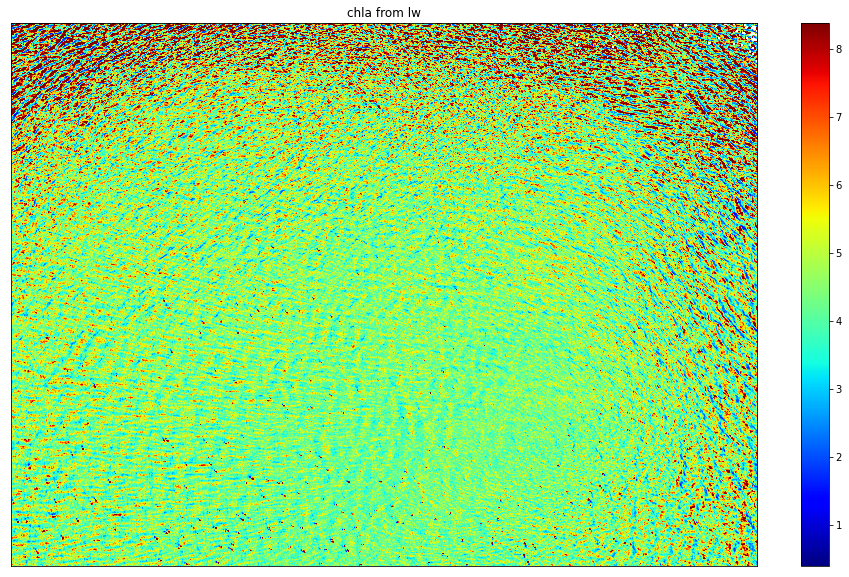

In [35]:
for i in range(25):
    fig, ax = plt.subplots(1, figsize=(20,10))
    print(sea_img_metadata[i]['yaw'])
    img = sea_imgs[i,:5] - smoothed_lt_lw
    #img[img > 0.03] = np.nan
    
    chla_lw = vec_chla_img(img[0], img[1])
    im = ax.imshow(chla_lw,cmap='jet', vmin=np.nanmedian(chla_lw)-4, vmax=np.nanmedian(chla_lw)+4)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title('chla from lw')
    plt.show()
    break

In [55]:
np.nanmedian(chla_lw)

4.386911077657864

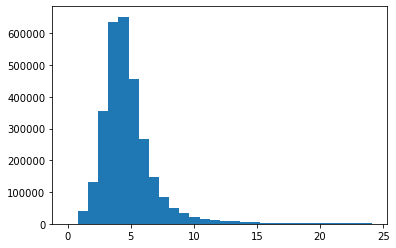

In [61]:
plt.hist(chla_lw.flatten(), bins=30)
plt.show()

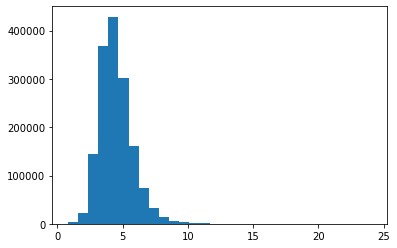

In [62]:
plt.hist(chla_lw[500:, 200:-200].flatten(), bins=30)
plt.show()

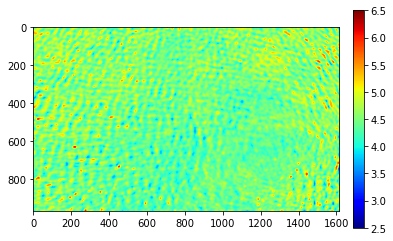

In [64]:
fig,ax = plt.subplots()
im = ax.imshow(ndimage.gaussian_filter(chla_lw[500:, 200:-200], sigma=(5, 5), order=0), cmap='jet', vmin=2.5,vmax=6.5)
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

Inspect the data geographically

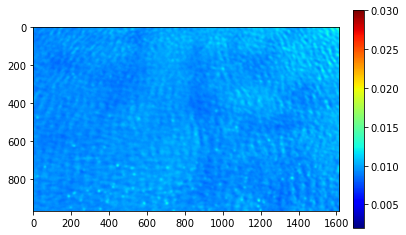

In [69]:
fig,ax = plt.subplots()
im = ax.imshow(ndimage.gaussian_filter(img[0,500:, 200:-200], sigma=(5, 5), order=0), cmap='jet', vmin=0.002, vmax=.03)
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

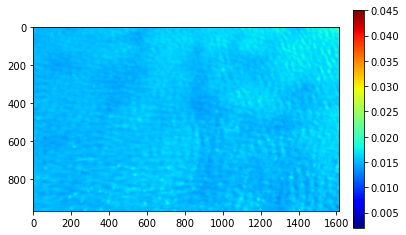

In [70]:
fig,ax = plt.subplots()
im = ax.imshow(ndimage.gaussian_filter(img[1,500:, 200:-200], sigma=(5, 5), order=0), cmap='jet', vmin=0.002, vmax=.045)
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

In [ ]:
for i in range(0,19):
    fig, ax = plt.subplots(1,6, figsize=(15,3))
    print('pitch:',sea_img_md_pitch_sort[i]['pitch'])
    print('yaw:',sea_img_md_pitch_sort[i]['yaw'])
    ax[0].set_title("Blue")
    im = ax[0].imshow(sea_imgs[sea_img_md_pitch_sort[i]['id'],0], interpolation='none', 
                   cmap='jet', vmin=0.02, vmax=.06)
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    #fig.colorbar(im,ax=ax[0])
    ax[1].set_title("Green")
    im2 = ax[1].imshow(sea_imgs[sea_img_md_pitch_sort[i]['id'],1], interpolation='none', 
                   cmap='jet', vmin=0.02, vmax=.06)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    #fig.colorbar(im2,ax=ax[1])
    im3 = ax[2].imshow(sea_imgs[sea_img_md_pitch_sort[i]['id'],2], interpolation='none', 
                   cmap='jet', vmin=0.02, vmax=.06)
    ax[2].set_xticks([])
    ax[2].set_yticks([])
    #fig.colorbar(im2,ax=ax[2])
    im4 = ax[3].imshow(sea_imgs[sea_img_md_pitch_sort[i]['id'],3], interpolation='none', 
                   cmap='jet', vmin=0.02, vmax=.06)
    ax[3].set_xticks([])
    ax[3].set_yticks([])
    #fig.colorbar(im2,ax=ax[3])
    im5 = ax[4].imshow(sea_imgs[sea_img_md_pitch_sort[i]['id'],4], interpolation='none', 
                   cmap='jet', vmin=0.02, vmax=.06)
    ax[4].set_xticks([])
    ax[4].set_yticks([])
    ax[5].set_title("Blue/Green")
    im6 = ax[5].imshow(sea_imgs[sea_img_md_pitch_sort[i]['id'],0]/sea_imgs[sea_img_md_pitch_sort[i]['id'],1], interpolation='none', 
                   cmap='YlGnBu', vmin=.5, vmax=1.2)
    ax[5].set_xticks([])
    ax[5].set_yticks([])
    #fig.colorbar(im2,ax=ax[4])
    plt.show()